In [1]:
from __future__ import print_function, division
import numpy as np
from glob import glob
import pandas as pd
import os
from tqdm import tqdm
output_path = os.path.join('..','input')
import matplotlib.pyplot as plt
from skimage.util._montage import montage
from skimage.color import label2rgb
import h5py
from keras_applications.imagenet_utils import _obtain_input_shape
from keras import backend as K
from keras.layers import Input, Convolution2D, MaxPooling2D, Activation, concatenate, Dropout, GlobalAveragePooling2D, BatchNormalization
from keras.models import Model
from keras.engine.topology import get_source_inputs
from keras.utils import get_file
from keras.utils import layer_utils
from keras.layers.merge import add
import keras
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
from sklearn.metrics import classification_report
from IPython import display
from sklearn.metrics import roc_curve, auc
from keras.models import load_model
%matplotlib inline

Using TensorFlow backend.


In [2]:
SqueezeNet10 = load_model('SqueezeNet10_Trained.h5')
AlexNet8 = load_model('AlexNet8_Trained.h5')
ResSQNet10 = load_model('ResSQNet10_Trained.h5')
ResSQNet20 = load_model('ResSQNet20_Trained.h5')

In [3]:
with h5py.File('all_patches.hdf5') as luna_h5:
    all_slices = luna_h5['ct_slices'].value
    all_classes = luna_h5['slice_class'].value
    print('data', all_slices.shape, 'classes', all_classes.shape)

D:\Users\asus\anaconda3\envs\keras\lib\site-packages\ipykernel\__main__.py:1: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  if __name__ == '__main__':
D:\Users\asus\anaconda3\envs\keras\lib\site-packages\ipykernel\__main__.py:2: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  from ipykernel import kernelapp as app


data (6691, 64, 64) classes (6691, 1)


D:\Users\asus\anaconda3\envs\keras\lib\site-packages\ipykernel\__main__.py:3: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  app.launch_new_instance()


In [4]:
X_vec = (np.expand_dims(all_slices,-1) - np.mean(all_slices))/np.std(all_slices)

y_vec = to_categorical(all_classes)
X_train, X_test, y_train, y_test = train_test_split(X_vec, y_vec, 
                                                   train_size = 0.75,
                                                   random_state = 1, 
                                                   stratify = all_classes)

Text(0.5, 1.0, 'Benign Tiles')

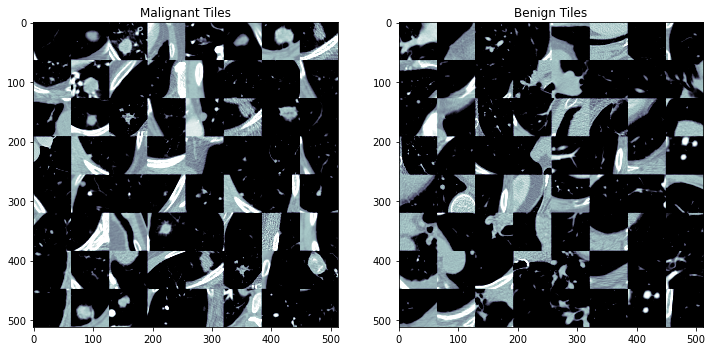

In [5]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize = (12, 6))
plt_args = dict(cmap = 'bone', vmin = -600, vmax = 300)
ax1.imshow(montage(all_slices[np.random.choice(np.where(all_classes>0.5)[0],size = 64)]), **plt_args)
ax1.set_title('Malignant Tiles')
ax2.imshow(montage(all_slices[np.random.choice(np.where(all_classes<0.5)[0],size = 64)]), **plt_args)
ax2.set_title('Benign Tiles')

In [6]:
'''AlexNet_8  accuracy'''
y_pred_proba = AlexNet8.predict(X_test)
y_pred = np.argmax(y_pred_proba,1)
print('')
print(classification_report(np.argmax(y_test,1),
                      y_pred))


              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1041
           1       0.95      0.95      0.95       632

    accuracy                           0.96      1673
   macro avg       0.96      0.96      0.96      1673
weighted avg       0.96      0.96      0.96      1673



In [7]:
'''SqueezeNet_10  accuracy'''
y_pred_proba = SqueezeNet10.predict(X_test)
y_pred = np.argmax(y_pred_proba,1)
print('')
print(classification_report(np.argmax(y_test,1),
                      y_pred))


              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1041
           1       0.95      0.94      0.94       632

    accuracy                           0.96      1673
   macro avg       0.95      0.95      0.95      1673
weighted avg       0.96      0.96      0.96      1673



In [8]:
'''ResSqueezeNet_10  accuracy'''
y_pred_proba = ResSQNet10.predict(X_test)
y_pred = np.argmax(y_pred_proba,1)
print('')
print(classification_report(np.argmax(y_test,1),
                      y_pred))


              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1041
           1       0.96      0.95      0.95       632

    accuracy                           0.97      1673
   macro avg       0.97      0.96      0.96      1673
weighted avg       0.97      0.97      0.97      1673



In [12]:
'''ResSqueezeNet_20  accuracy'''
y_pred_proba = ResSQNet20.predict(X_test)
y_pred = np.argmax(y_pred_proba,1)
print('')
print(classification_report(np.argmax(y_test,1),
                      y_pred))


              precision    recall  f1-score   support

           0       0.97      0.98      0.98      1041
           1       0.97      0.95      0.96       632

    accuracy                           0.97      1673
   macro avg       0.97      0.97      0.97      1673
weighted avg       0.97      0.97      0.97      1673



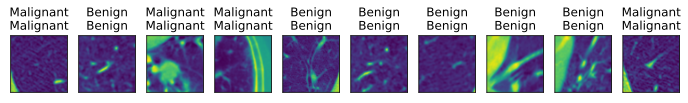

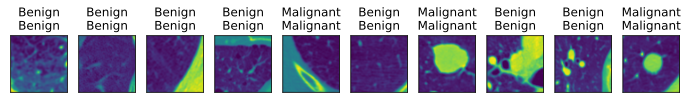

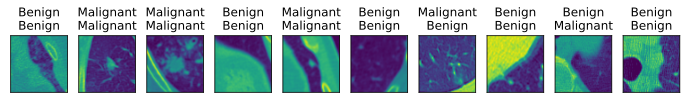

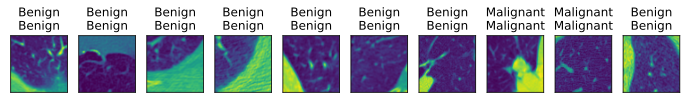

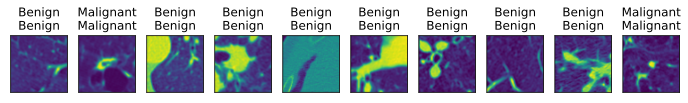

...

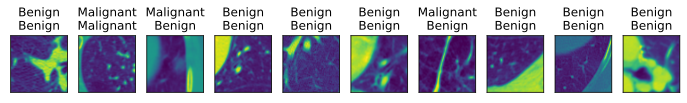

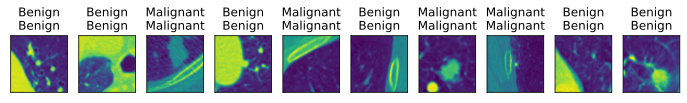

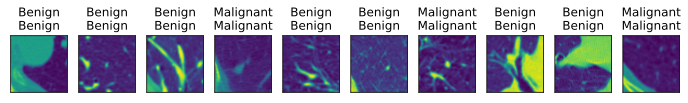

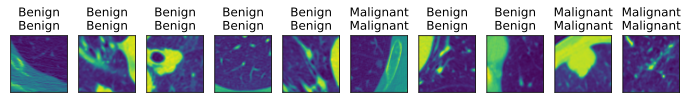

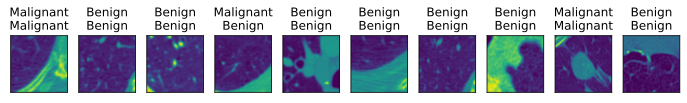

In [ ]:
y_pred_proba = ResSQNet20.predict(X_test)
y_pred = np.argmax(y_pred_proba,1)

def use_svg_display():
    display.set_matplotlib_formats('svg')

def get_labels(labels):
    text_labels = ['Benign', 'Malignant']
    return [text_labels[int(i)] for i in labels]

def show_fashion_mnist(images, labels):
    use_svg_display()
    _, figs = plt.subplots(1, len(images), figsize=(12, 12))
    for f, img, lbl in zip(figs, images, labels):
        f.imshow(img.reshape(64,64))
        f.set_title(lbl)
        f.axes.get_xaxis().set_visible(False)
        f.axes.get_yaxis().set_visible(False)
    plt.show()

true_labels = get_labels(np.argmax(y_test,1))
pred_labels = get_labels(y_pred)
titles = [true + '\n' + pred for true, pred in zip(true_labels, pred_labels)]

for i in range(0,1670,10):
    show_fashion_mnist(X_test[i:i+10], titles[i:i+10])